# Growth Mechanism with Details

In [2]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import sys
import numpy as np
import os
import matplotlib.pyplot as plt
from matplotlib import gridspec
from matplotlib import colors

sys.path.append('../../../src')
from m3_learning.nn.random import random_seed
from m3_learning.viz.style import set_style
from m3_learning.viz.printing import printer
from m3_learning.viz.layout import imagemap, layout_fig, labelfigs
from m3_learning.RHEED.Dataset import RHEED_parameter_dataset, RHEED_spot_Dataset
from m3_learning.RHEED.Viz import Viz
from m3_learning.RHEED.Analysis import detect_peaks, analyze_curves, process_rheed_data, normalize_0_1, reset_tails, remove_linear_bg, denoise_fft, denoise_median
from m3_learning.RHEED.Packed_functions import decay_curve_examples
from m3_learning.RHEED.Analysis_umich import fit_curves, analyze_rheed_data, select_range, plot_activation_energy

plot_size = (6, 2)
color_blue = (44/255,123/255,182/255)
color_gray = (128/255, 128/255, 128/255, 0.5)
seq_colors = ['#00429d','#2e59a8','#4771b2','#5d8abd','#73a2c6','#8abccf','#a5d5d8','#c5eddf','#ffffe0']
bgc1, bgc2 = (*colors.hex2color(seq_colors[0]), 0.3), (*colors.hex2color(seq_colors[5]), 0.3)

## 1. Visualize the spots from collected data

In [3]:
para_path = 'd:/RHEED/YG063_RHEED_gaussian_fit_parameters.h5'
ds_para = RHEED_parameter_dataset(para_path, camera_freq=1000, sample_name='yg063')
ds_para.dataset_names
# ds_para.data_info

['SrRuO3_deposition']

## 2. Analyze the Decay Curve

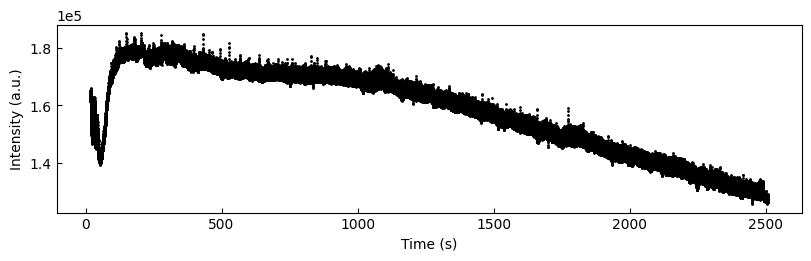

In [4]:
x, y = ds_para.load_curve(growth='SrRuO3_deposition', spot='spot_2', metric='img_rec_sum', x_start=0)
data = np.stack([x, y], 1)
data = select_range(data, 18, 3000)
x, y = data[:, 0], data[:, 1]

fig, ax1 = plt.subplots(1, 1, figsize=(8, 2.5), layout='compressed')
ax1.scatter(x, y, color='k', s=1)
Viz.set_labels(ax1, xlabel='Time (s)', ylabel='Intensity (a.u.)', ticks_both_sides=False)
plt.show()

#### cutoff

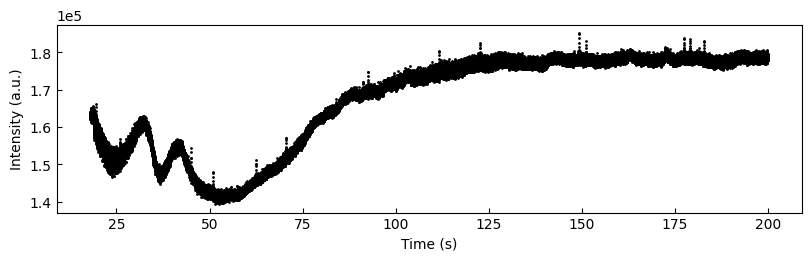

In [5]:
x, y = ds_para.load_curve(growth='SrRuO3_deposition', spot='spot_2', metric='img_rec_sum', x_start=0)
data = np.stack([x, y], 1)
data = select_range(data, 18, 200)
x, y = data[:, 0], data[:, 1]

fig, ax1 = plt.subplots(1, 1, figsize=(8, 2.5), layout='compressed')
ax1.scatter(x, y, color='k', s=1)
Viz.set_labels(ax1, xlabel='Time (s)', ylabel='Intensity (a.u.)', ticks_both_sides=False)
plt.show()

#### denoise params

img_sum-spot_2


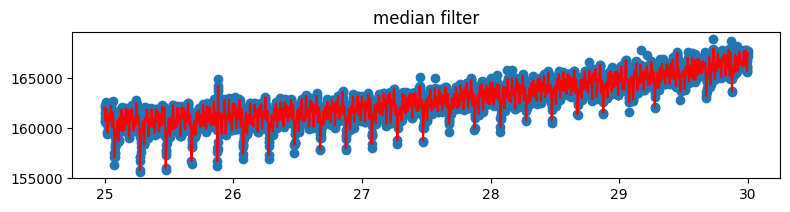

In [6]:
# denoise_params = {'savgol_window_order': (51, 3), 'pca_component': None, 'fft_cutoff_order':(5, 1), 'median_kernel_size':51}
denoise_params = {'savgol_window_order': (7, 2), 'pca_component': None, 'fft_cutoff_order':(6, 4), 'median_kernel_size':None}
savgol_window_order = denoise_params['savgol_window_order']
pca_component = denoise_params['pca_component']
fft_cutoff_order = denoise_params['fft_cutoff_order']
median_kernel_size = denoise_params['median_kernel_size'] 


# for spot in ['spot_1', 'spot_2']:
for spot in ['spot_2']:
    # for m in ["img_mean", "img_sum", "img_max", "img_rec_sum", "img_rec_max", "img_rec_mean", 
    #       "height", "x", "y", "width_x", "width_y"]:
    # for m in ["img_sum", "img_rec_sum"]:
    for m in ["img_sum"]:
        sample_x, sample_y = ds_para.load_curve(growth='SrRuO3_deposition', spot=spot, metric=m, x_start=0)
        data = np.stack([sample_x, sample_y], 1)
        data = select_range(data, 25, 30)
        print(m+'-'+spot)
        sample_x, sample_y = data[:, 0], data[:, 1]

        # fig, ax1 = plt.subplots(1, 1, figsize=(8, 2.5), layout='compressed')
        # ax1.scatter(sample_x, sample_y, color='k', s=1)
        # Viz.set_labels(ax1, xlabel='Time (s)', ylabel='Intensity (a.u.)', ticks_both_sides=False)
        # plt.show()
        
        # denoised_sample_y = denoise_fft(sample_x, sample_y, cutoff_freq=10, denoise_order=3, sample_frequency=2000)
        denoised_sample_x, denoised_sample_y = denoise_median(sample_x, sample_y, kernel_size=median_kernel_size, viz=True)

img_sum-spot_2


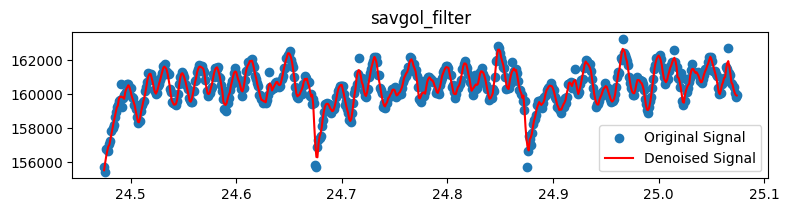

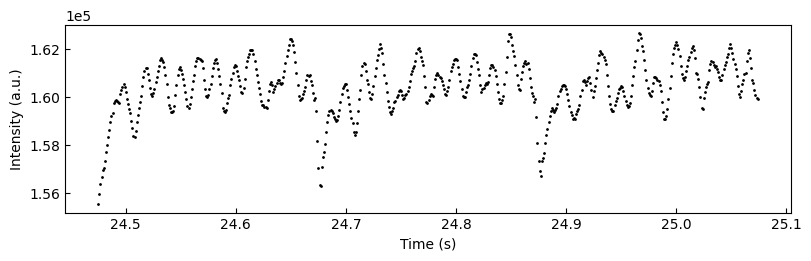

In [7]:
denoise_params = {'savgol_window_order': (7, 3), 'pca_component': None, 'fft_cutoff':None, 'fft_order':None, 'median_kernel_size':None}
spot = 'spot_2'
m = "img_sum"
laser_freq = 5
camera_freq = 1000

sample_x, sample_y = ds_para.load_curve(growth='SrRuO3_deposition', spot=spot, metric=m, x_start=0)
data = np.stack([sample_x, sample_y], 1)
data = select_range(data, 24.474, 25.075)
print(m+'-'+spot)
sample_x, sample_y = data[:, 0], data[:, 1]
sample_x, sample_y = process_rheed_data(sample_x, sample_y, camera_freq, denoise_params, True)

fig, ax1 = plt.subplots(1, 1, figsize=(8, 2.5), layout='compressed')
ax1.scatter(sample_x, sample_y, color='k', s=1)
Viz.set_labels(ax1, xlabel='Time (s)', ylabel='Intensity (a.u.)', ticks_both_sides=False)
plt.show()

SrRuO3_deposition


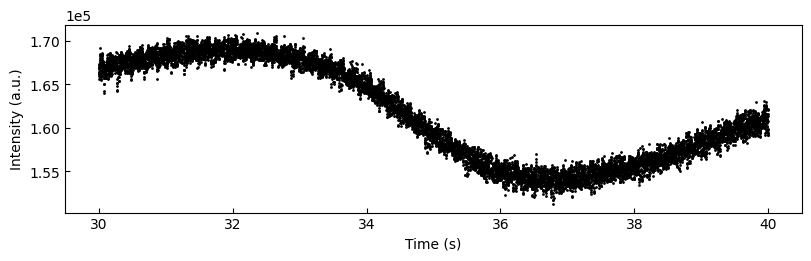

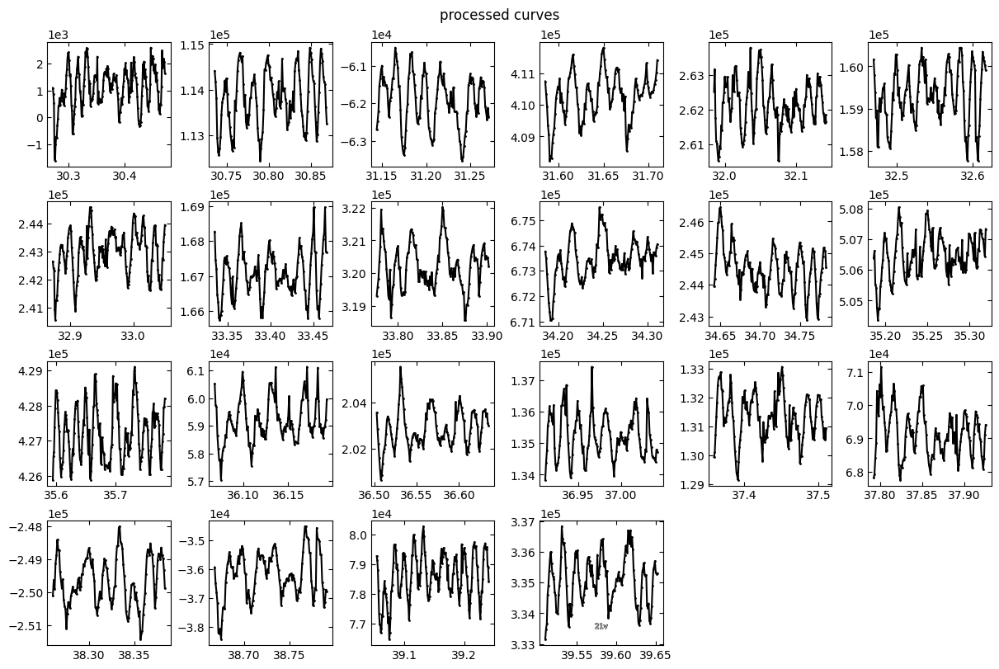

<__array_function__ internals>:180: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
../../../src\m3_learning\RHEED\Analysis_umich.py:61: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  ys_nor_all = np.array(ys_nor_all)
../../../src\m3_learning\RHEED\Analysis_umich.py:62: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  ys_nor_fit_all = np.ar

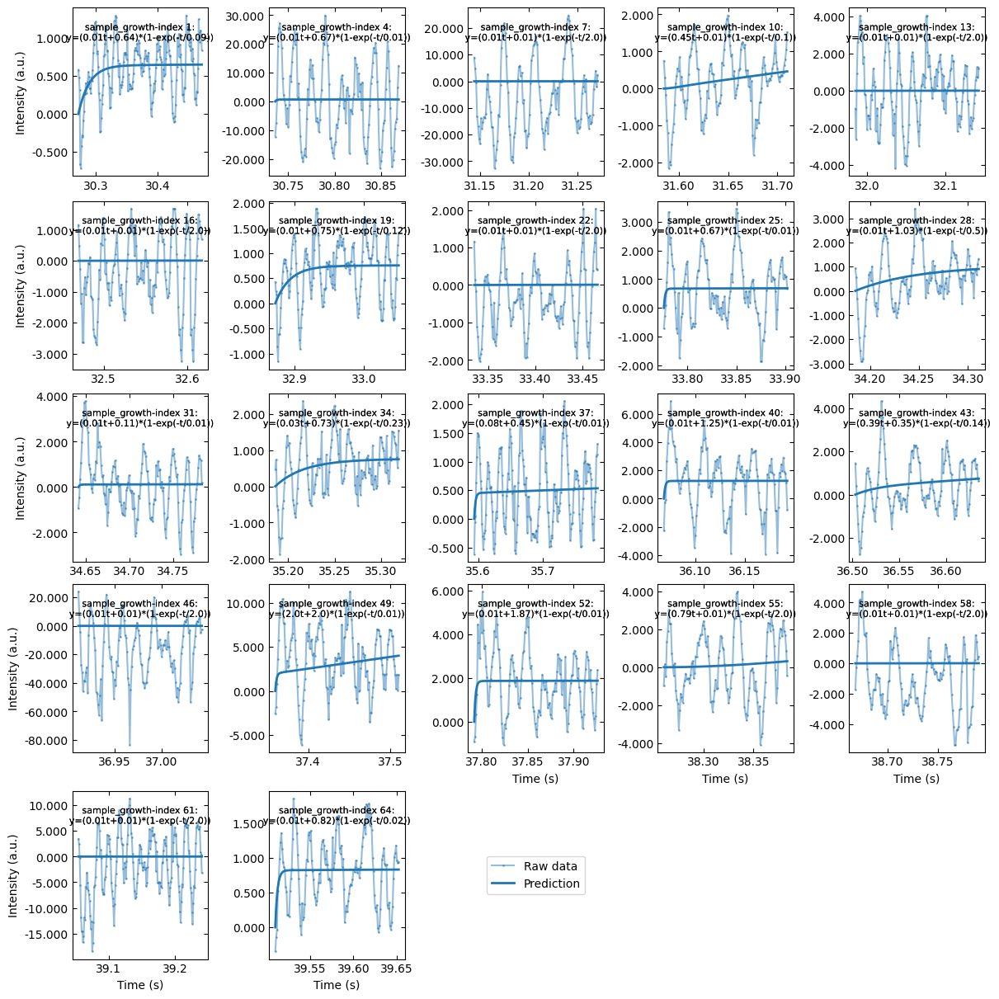

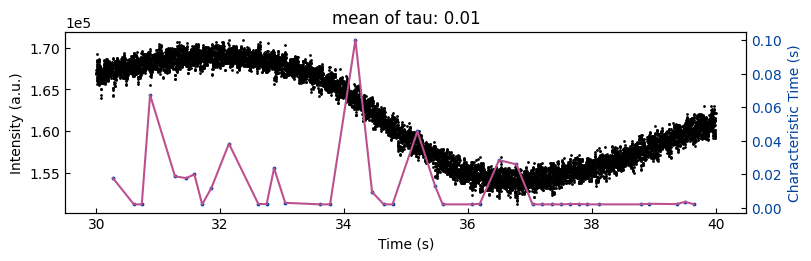

In [8]:
# denoise_params = {'savgol_window_order': (51,3), 'pca_component': 3, 'fft_cutoff_order':(20, 1), 'median_kernel_size':51}
denoise_params = {'savgol_window_order': None, 'pca_component': None, 'fft_cutoff':None, 'fft_order':None, 'median_kernel_size':None}
curve_params = {'trim_first':0, 'tune_tail':True, 'convolve_step':3, 'prominence':0.1, 'mode':'valid', 'linear_ratio':0.8}
normalize_params = {'I_diff': None, 'unify':True, 'bounds':[0.01, 2], 'p_init':(1, 0.1, 0.1), 'n_std':1}
viz_params = {'viz_denoise': False, 'viz_raw_curves':False, 'per_plot':3, 'viz_processed_curves': True, 'viz_fittings': True, 
              'viz_ab': False, 'viz_tau': True}
    
laser_freq = 5
camera_freq = 1000

ranges_list = [(18, 80)]
ranges_list = [(30, 40)]
dataset_list = ['SrRuO3_deposition']
tau_list = []

for dataset, ranges in zip(dataset_list, ranges_list):
    sample_x, sample_y = ds_para.load_curve(growth=dataset, spot='spot_2', metric='img_sum', x_start=0)
    print(dataset)
        
    data = np.stack([sample_x, sample_y], 1)
    data = select_range(data, *ranges)
    
    sample_x, sample_y = data[:, 0], data[:, 1]
    fig, ax1 = plt.subplots(1, 1, figsize=(8, 2.5), layout='compressed')
    ax1.scatter(sample_x, sample_y, color='k', s=1)
    Viz.set_labels(ax1, xlabel='Time (s)', ylabel='Intensity (a.u.)', ticks_both_sides=False)
    plt.show()


    parameters_all, x_list_all, info, tau = analyze_rheed_data(data, camera_freq, laser_freq, denoise_params, curve_params, normalize_params, viz_params)
    tau_list.append(tau)

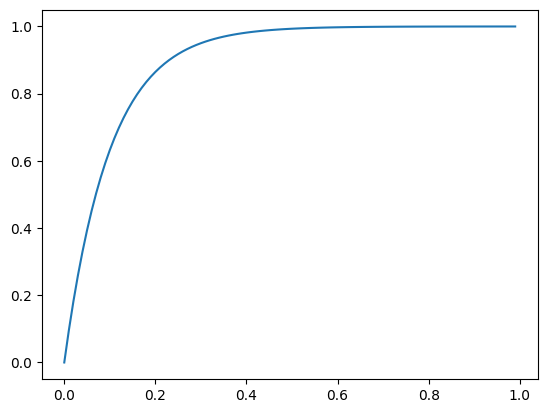

In [9]:
x = np.arange(0, 1, 0.01)
y = 1-np.exp(-x/0.1)
plt.plot(x, y)

c:\Users\yig319\Anaconda3\envs\m3\lib\site-packages\scipy\optimize\_minpack_py.py:881: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


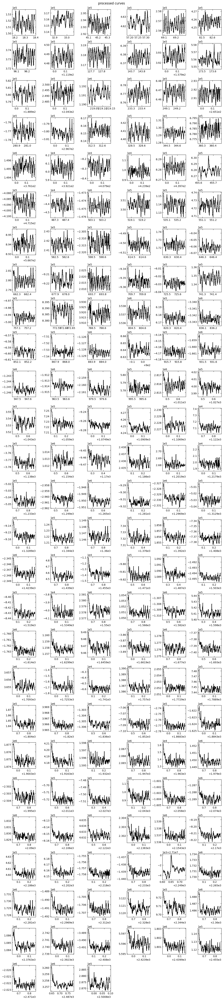

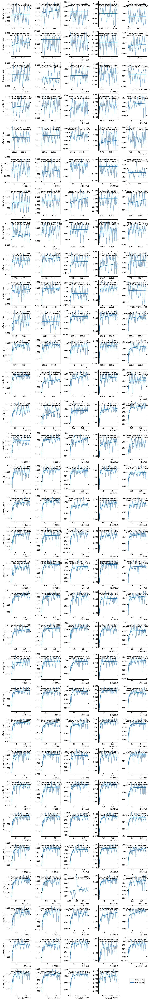

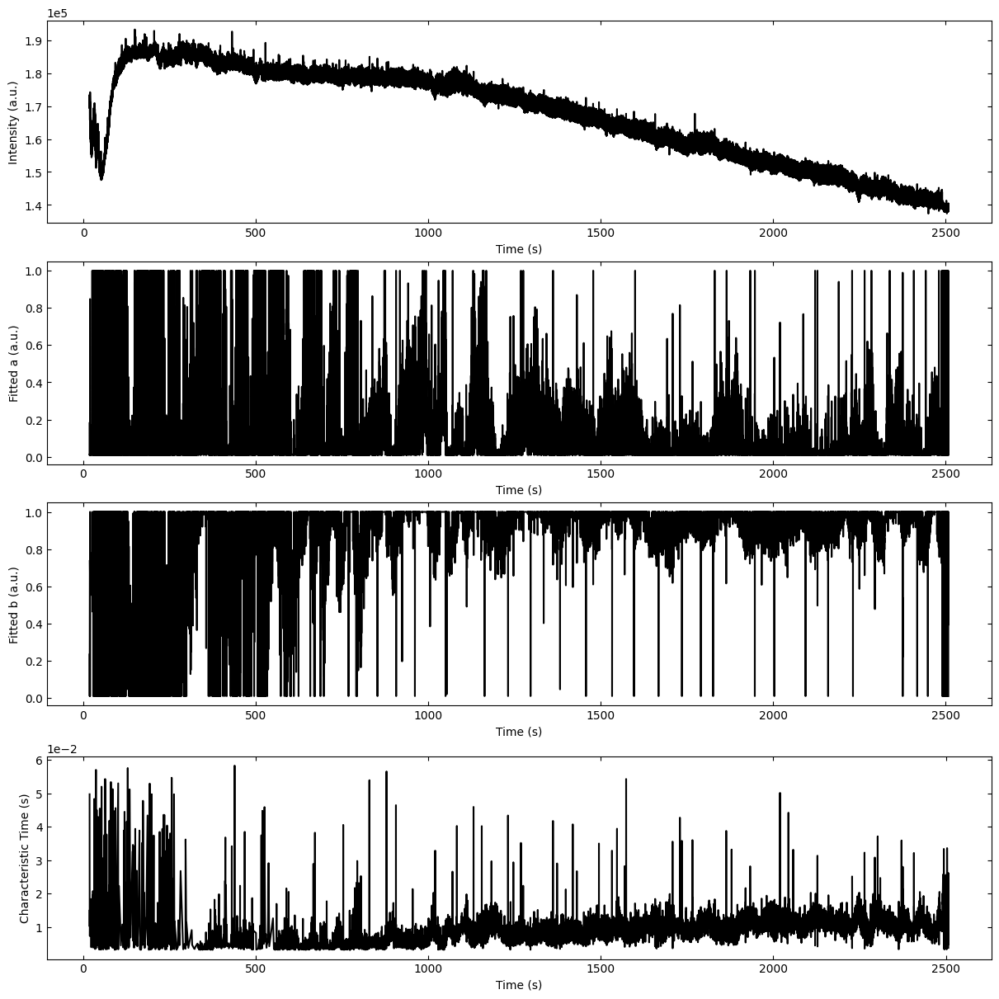

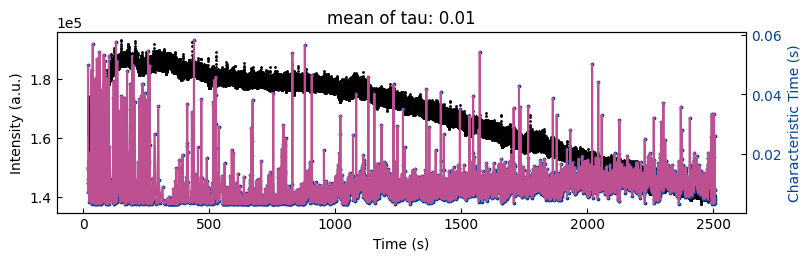

In [11]:
# denoise_params = {'savgol_window_order': (51,3), 'pca_component': 3, 'fft_cutoff_order':(20, 1), 'median_kernel_size':51}
denoise_params = {'savgol_window_order': None, 'pca_component': None, 'fft_cutoff':None, 'fft_order':None, 'median_kernel_size':None}
curve_params = {'trim_first':8, 'tune_tail':True, 'convolve_step':3, 'prominence':0.1, 'mode':'valid', 'linear_ratio':0.8}
normalize_params = {'I_diff': None, 'unify':True, 'bounds':[0.01, 1], 'p_init':(1, 0.1, 0.1), 'n_std':1}
viz_params = {'viz_denoise': False, 'viz_raw_curves':False, 'per_plot':80, 'viz_processed_curves': True, 'viz_fittings': True, 
              'viz_ab': True, 'viz_tau': True}
    
laser_freq = 5
camera_freq = 1000
range = (18, 3000)
growth = 'SrRuO3_deposition'

sample_x, sample_y = ds_para.load_curve(growth=growth, spot='spot_2', metric='img_sum', x_start=0)
data = np.stack([sample_x, sample_y], 1)
data = select_range(data, *range)

parameters_all, x_list_all, info, tau = analyze_rheed_data(data, camera_freq, laser_freq, denoise_params, curve_params, normalize_params, viz_params)

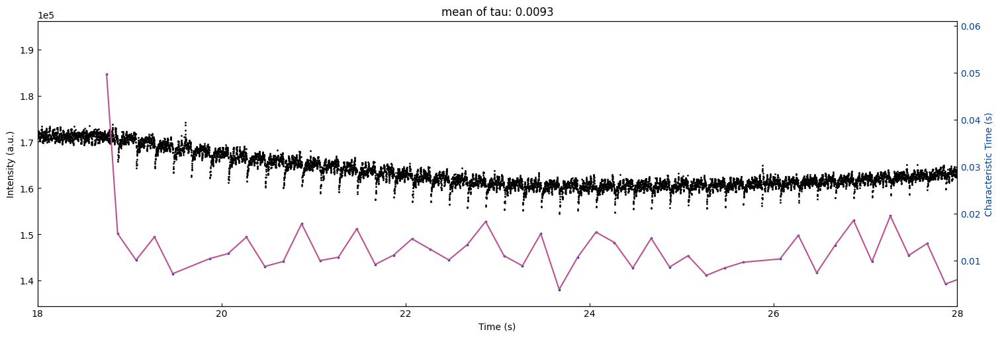

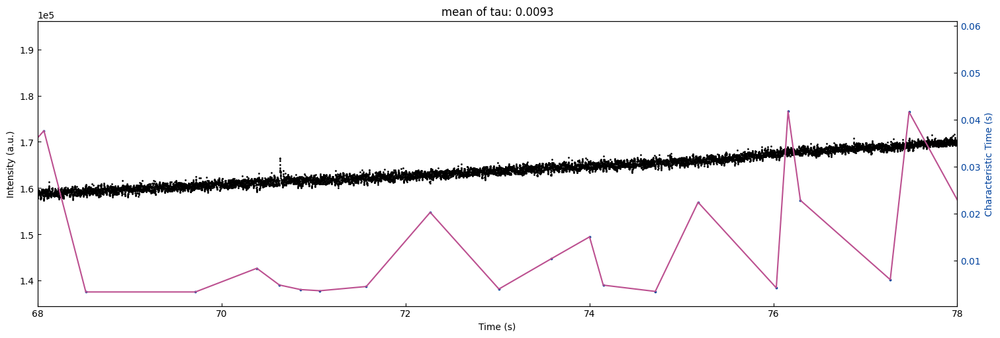

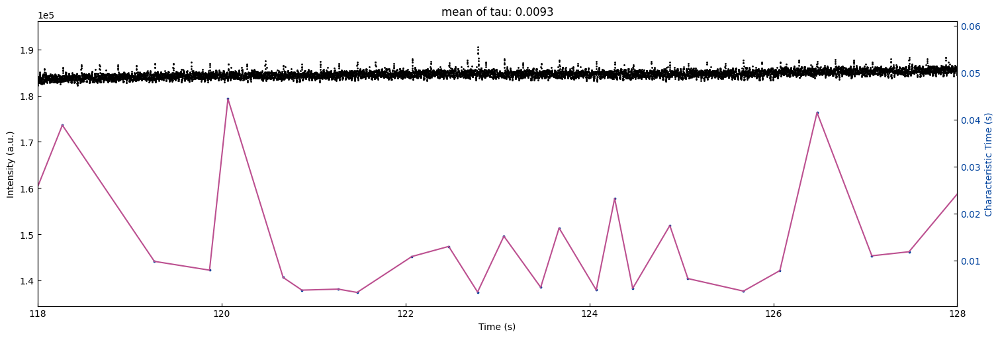

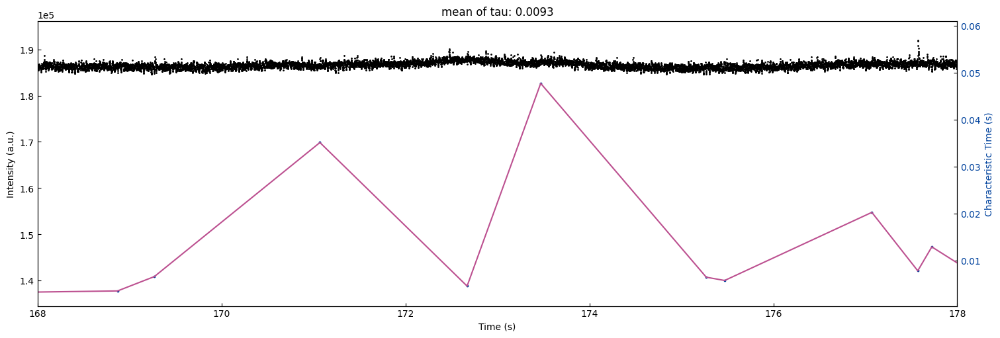

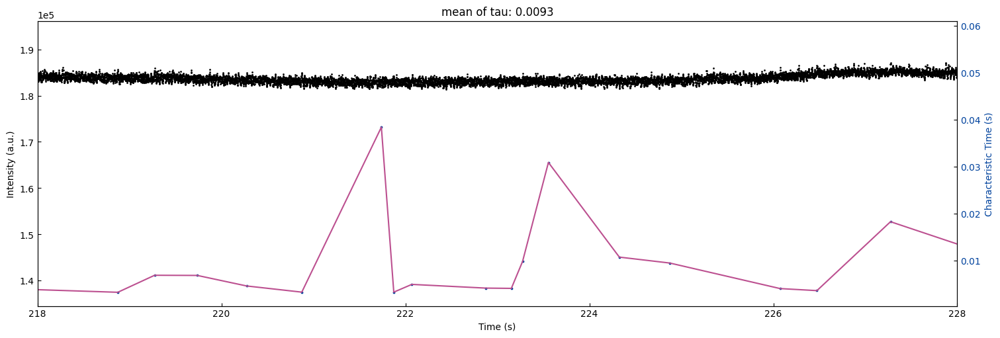

...

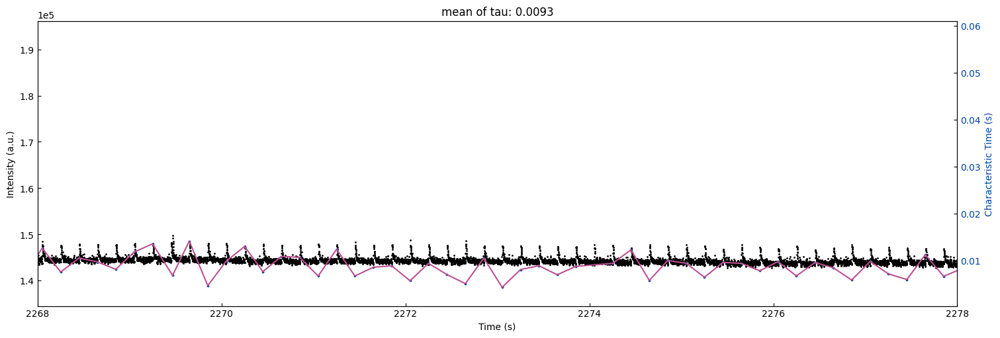

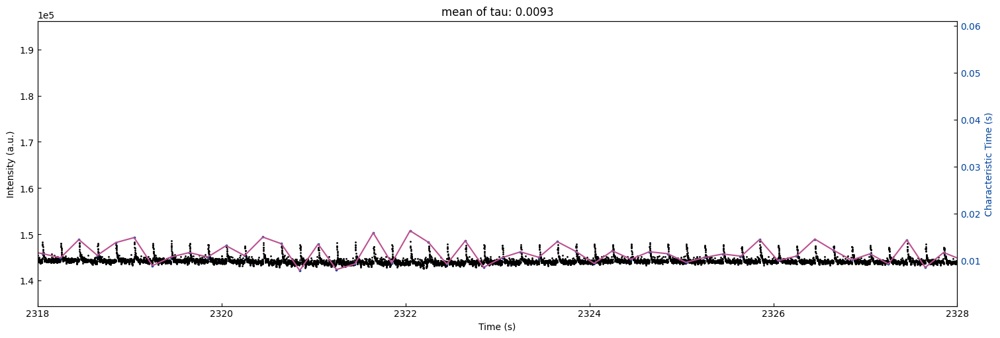

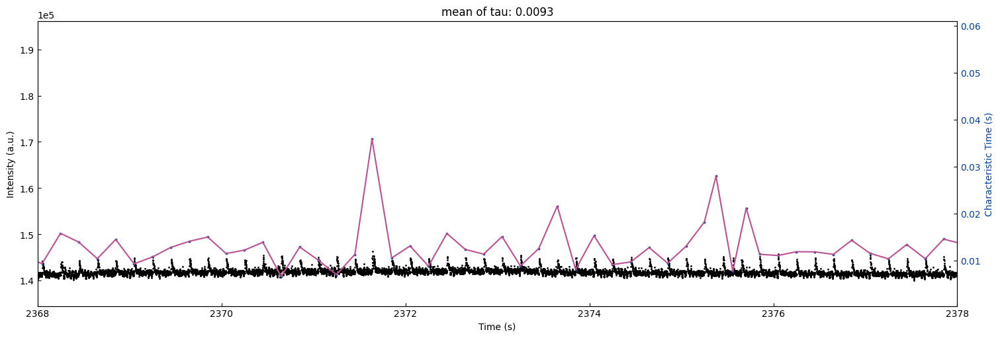

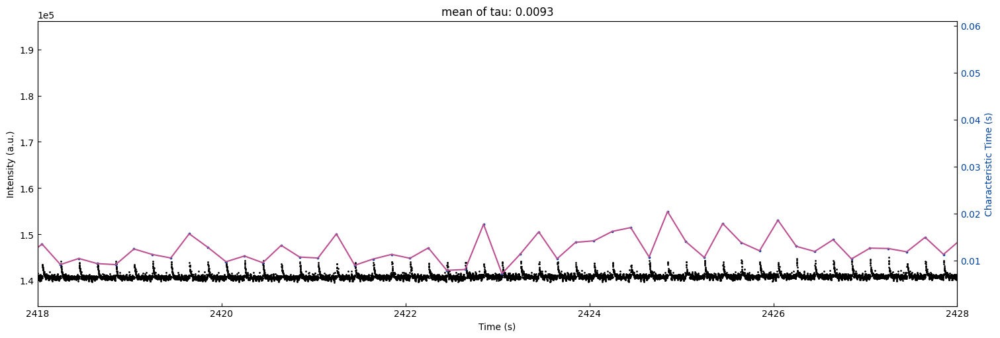

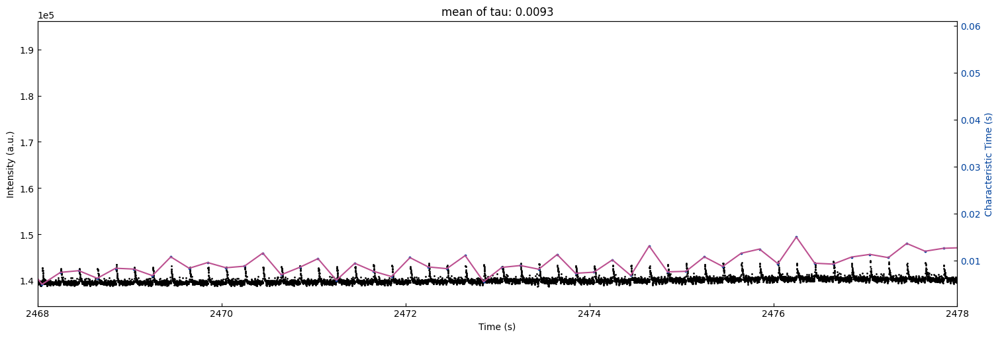

In [184]:
import matplotlib.pyplot as plt

# remove outliers
n_std = normalize_params['n_std']
x_list_all = np.array(x_list_all) + sample_x[0]

tau = parameters_all[:,2]/laser_freq
x_clean = x_list_all[np.where(tau < np.mean(tau) + n_std*np.std(tau))[0]]
tau = tau[np.where(tau < np.mean(tau) + n_std*np.std(tau))[0]]

x_clean = x_clean[np.where(tau > np.mean(tau) - n_std*np.std(tau))[0]]
tau = tau[np.where(tau > np.mean(tau) - n_std*np.std(tau))[0]]
# print('mean of tau:', np.mean(tau))

if viz_params['viz_tau']:
        for xlim in range(18, 2500, 50):
                fig, ax1 = plt.subplots(1, 1, figsize=(15, 5), layout='compressed')
                ax1.scatter(sample_x, sample_y, color='k', s=1)
                Viz.set_labels(ax1, xlabel='Time (s)', ylabel='Intensity (a.u.)', ticks_both_sides=False)

                ax2 = ax1.twinx()
                ax2.scatter(x_clean, tau, color=seq_colors[0], s=3)
                ax2.plot(x_clean,  tau, color='#bc5090', markersize=3)
                Viz.set_labels(ax2, ylabel='Characteristic Time (s)', yaxis_style='lineplot', ticks_both_sides=False)
                ax2.tick_params(axis="y", color='k', labelcolor=seq_colors[0])
                ax2.set_ylabel('Characteristic Time (s)', color=seq_colors[0])
                
                plt.xlim(xlim, xlim+10)
                plt.title(f'mean of tau: {np.mean(tau):.4f}')
                plt.show()

In [ ]:
# denoise_params = {'savgol_window_order': (51,3), 'pca_component': 3, 'fft_cutoff_order':(20, 1), 'median_kernel_size':51}
denoise_params = {'savgol_window_order': None, 'pca_component': None, 'fft_cutoff':None, 'fft_order':None, 'median_kernel_size':None}
curve_params = {'trim_first':8, 'tune_tail':True, 'convolve_step':3, 'prominence':0.1, 'mode':'valid', 'linear_ratio':0.8}
normalize_params = {'I_diff': None, 'unify':True, 'bounds':[0.01, 1], 'p_init':(1, 0.1, 0.1), 'n_std':1}
viz_params = {'viz_denoise': False, 'viz_raw_curves':False, 'per_plot':80, 'viz_processed_curves': True, 'viz_fittings': True, 
              'viz_ab': True, 'viz_tau': True}
    
laser_freq = 5
camera_freq = 1000

ranges_list = [(18, 3000)]
temp_list = ['SrRuO3_deposition']
tau_list = []

for temp, ranges in zip(temp_list, ranges_list):
    sample_x, sample_y = ds_para.load_curve(growth=temp, spot='spot_2', metric='img_sum', x_start=0)
    print(temp)
    data = np.stack([sample_x, sample_y], 1)
    data = select_range(data, *ranges)

    parameters_all, x_list_all, info, tau = analyze_rheed_data(data, camera_freq, laser_freq, denoise_params, curve_params, normalize_params, viz_params)
    tau_list.append(tau)

In [ ]:
np.save('./Saved_data/tau_PM11_350C.npy', tau_list[0])
np.save('./Saved_data/tau_PM12_400C.npy', tau_list[1])
np.save('./Saved_data/tau_PM14_450C.npy', tau_list[2])
np.save('./Saved_data/tau_PM17_800C.npy', tau_list[3])